<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [1193]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

plt.style.use('ggplot')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [1312]:
#from sklearn.datasets import datasets
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, LassoCV, ElasticNetCV
 

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovateable:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

In [1195]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [1196]:
# Load the data
house = pd.read_csv('./housing.csv')

In [1197]:
house.shape

(1460, 81)

In [1198]:
# A:
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


### EDA

In [1199]:
house.HouseStyle.value_counts(dropna=False)

1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64

In [1201]:
house.MSZoning.value_counts(dropna=False)

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64

In [1204]:
#Dropping the non residential rows, as required 
house = house[house.MSZoning != 'C (all)']

In [1205]:
house['MSZoning'].value_counts()

RL    1151
RM     218
FV      65
RH      16
Name: MSZoning, dtype: int64

In [1207]:
house.keys()

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [1208]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1450 non-null   int64  
 1   MSSubClass     1450 non-null   int64  
 2   MSZoning       1450 non-null   object 
 3   LotFrontage    1191 non-null   float64
 4   LotArea        1450 non-null   int64  
 5   Street         1450 non-null   object 
 6   Alley          89 non-null     object 
 7   LotShape       1450 non-null   object 
 8   LandContour    1450 non-null   object 
 9   Utilities      1450 non-null   object 
 10  LotConfig      1450 non-null   object 
 11  LandSlope      1450 non-null   object 
 12  Neighborhood   1450 non-null   object 
 13  Condition1     1450 non-null   object 
 14  Condition2     1450 non-null   object 
 15  BldgType       1450 non-null   object 
 16  HouseStyle     1450 non-null   object 
 17  OverallQual    1450 non-null   int64  
 18  OverallC

In [1209]:
house.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1450.000000,1450.000000,1191.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1442.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1371.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000
mean,731.364138,56.903448,70.052897,10523.831724,6.114483,5.582069,1971.593103,1985.049655,104.404300,445.162759,46.870345,567.375862,1059.408966,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,6.522069,0.616552,1978.627279,1.770345,473.277931,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,43.365517,6.312414,2007.812414,181654.942069
std,421.554345,42.265033,24.301013,10012.185355,1.372860,1.107330,30.022696,20.552319,181.486539,456.353871,161.828458,442.584978,439.207322,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,1.625324,0.644991,24.592779,0.745136,212.687621,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,497.636495,2.698244,1.326321,79176.485241
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1906.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,37900.000000
25%,366.250000,20.000000,59.000000,7544.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,796.000000,882.500000,0.000000,0.000000,1131.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.500000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,731.500000,50.000000,70.000000,9496.000000,6.000000,5.000000,1973.000000,1994.000000,0.000000,384.000000,0.000000,475.000000,992.000000,1088.000000,0.000000,0.000000,1466.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163945.000000
75%,1096.750000,70.000000,80.000000,11613.500000,7.000000,6.000000,2001.000000,2004.000000,166.750000,713.750000,0.000000,808.000000,1301.500000,1392.000000,728.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [1210]:
house.describe(include='all')

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
count,1450.000000,1450.000000,1450,1191.000000,1450.000000,1450,89,1450,1450,1450,1450,1450,1450,1450,1450,1450,1450,1450.000000,1450.000000,1450.000000,1450.000000,1450,1450,1450,1450,1442,1442.000000,1450,1450,1450,1413,1413,1412,1413,1450.000000,1412,1450.000000,1450.000000,1450.000000,1450,1450,1450,1449,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450,1450.000000,1450,1450.000000,769,1371,1371.000000,1371,1450.000000,1450.000000,1371,1371,1450,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,1450.000000,7,278,52,1450.000000,1450.000000,1450.000000,1450,1450,1450.000000
unique,NaN,NaN,4,NaN,NaN,2,2,4,4,2,5,3,25,9,8,5,8,NaN,NaN,NaN,NaN,6,8,15,16,4,NaN,4,5,6,4,4,4,6,NaN,6,NaN,NaN,NaN,6,5,2,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,6,NaN,3,NaN,NaN,5,5,3,NaN,NaN,NaN,NaN,NaN,NaN,3,4,4,NaN,NaN,NaN,9,6,NaN
top,NaN,NaN,RL,NaN,NaN,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,NaN,NaN,NaN,NaN,Gable,CompShg,VinylSd,VinylSd,None,NaN,TA,TA,PConc,TA,TA,No,Unf,NaN,Unf,NaN,NaN,NaN,GasA,Ex,Y,SBrkr,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,TA,NaN,Typ,NaN,Gd,Attchd,NaN,Unf,NaN,NaN,TA,TA,Y,NaN,NaN,NaN,NaN,NaN,NaN,Gd,MnPrv,Shed,NaN,NaN,NaN,WD,Normal,NaN
freq,NaN,NaN,1151,NaN,NaN,1446,50,916,1305,1449,1044,1375,225,1252,1436,1211,722,NaN,NaN,NaN,NaN,1135,1424,515,504,854,NaN,899,1275,647,639,1303,947,424,NaN,1246,NaN,NaN,NaN,1419,740,1361,1328,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,727,NaN,1350,NaN,379,870,NaN,600,NaN,NaN,1303,1319,1335,NaN,NaN,NaN,NaN,NaN,NaN,3,155,47,NaN,NaN,NaN,1261,1194,NaN
mean,731.364138,56.903448,NaN,70.052897,10523.831724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.114483,5.582069,1971.593103,1985.049655,NaN,NaN,NaN,NaN,NaN,104.404300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,445.162759,NaN,46.870345,567.375862,1059.408966,NaN,NaN,NaN,NaN,1164.773103,347.394483,5.531034,1517.698621,0.427586,0.057241,1.568966,0.384828,2.870345,1.046207,NaN,6.522069,NaN,0.616552,NaN,NaN,1978.627279,NaN,1.770345,473.277931,NaN,NaN,NaN,94.826897,46.537931,21.536552,3.433103,15.096552,2.777931,NaN,NaN,NaN,43.365517,6.312414,2007.812414,NaN,NaN,181654.942069
std,421.554345,42.265033,NaN,24.301013,10012.185355,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.372860,1.107330,30.022696,20.552319,NaN,NaN,NaN,NaN,NaN,181.486539,NaN,NaN,NaN,NaN,NaN,NaN,NaN,456.353871,NaN,161.828458,442.584978,439.207322,NaN,NaN,NaN,NaN,386.646095,437.094261,46.932966,525.154207,0.519394,0.238249,0.549549,0.503450,0.814645,0.219643,NaN,1.625324,NaN,0.644991,NaN,NaN,24.592779,NaN,0.745136,212.687621,NaN,NaN,NaN,125.560863,65.222761,60.838826,29.416948,55.893399,40.315051,NaN,NaN,NaN,497.636495,2.698244,1.326321,NaN,NaN,79176.485241
min,1.000000,20.000000,NaN,21.000000,1300.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,1.000000,1872.000000,1950.000000,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,2.000000,NaN,0.000000,NaN,NaN,1906.000000,Na

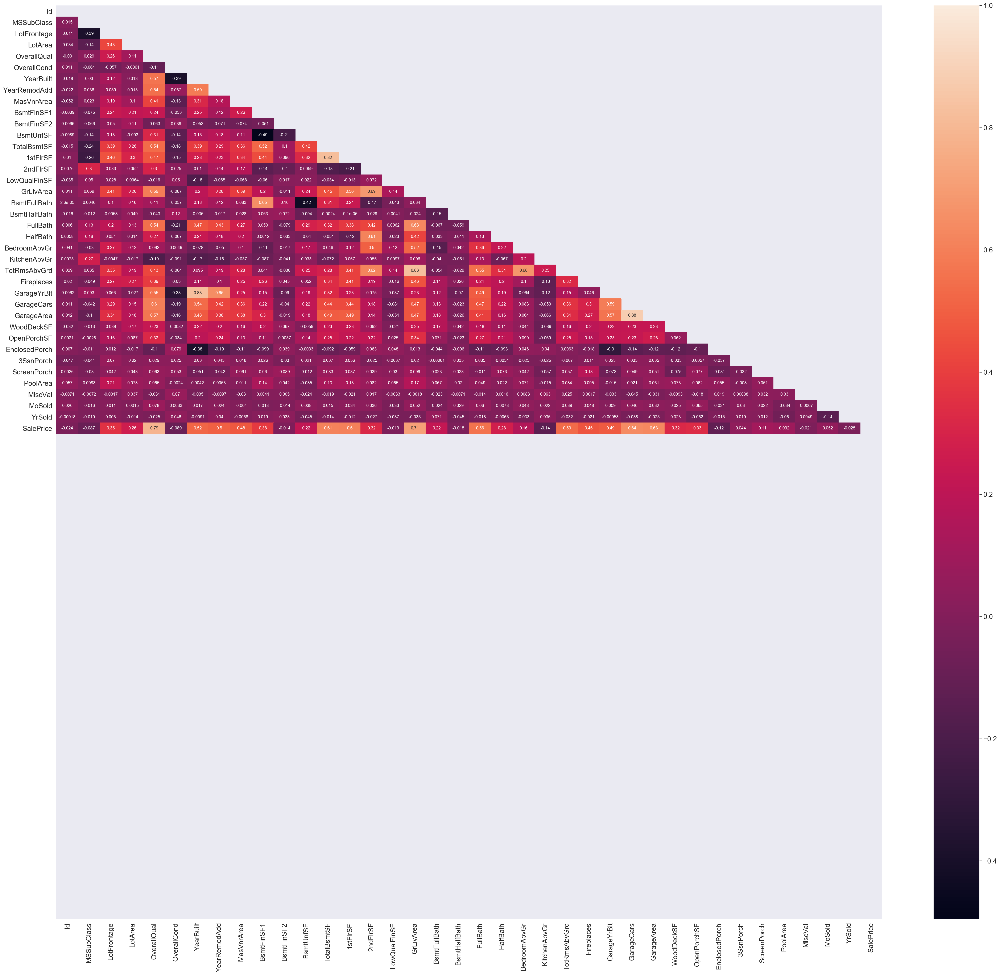

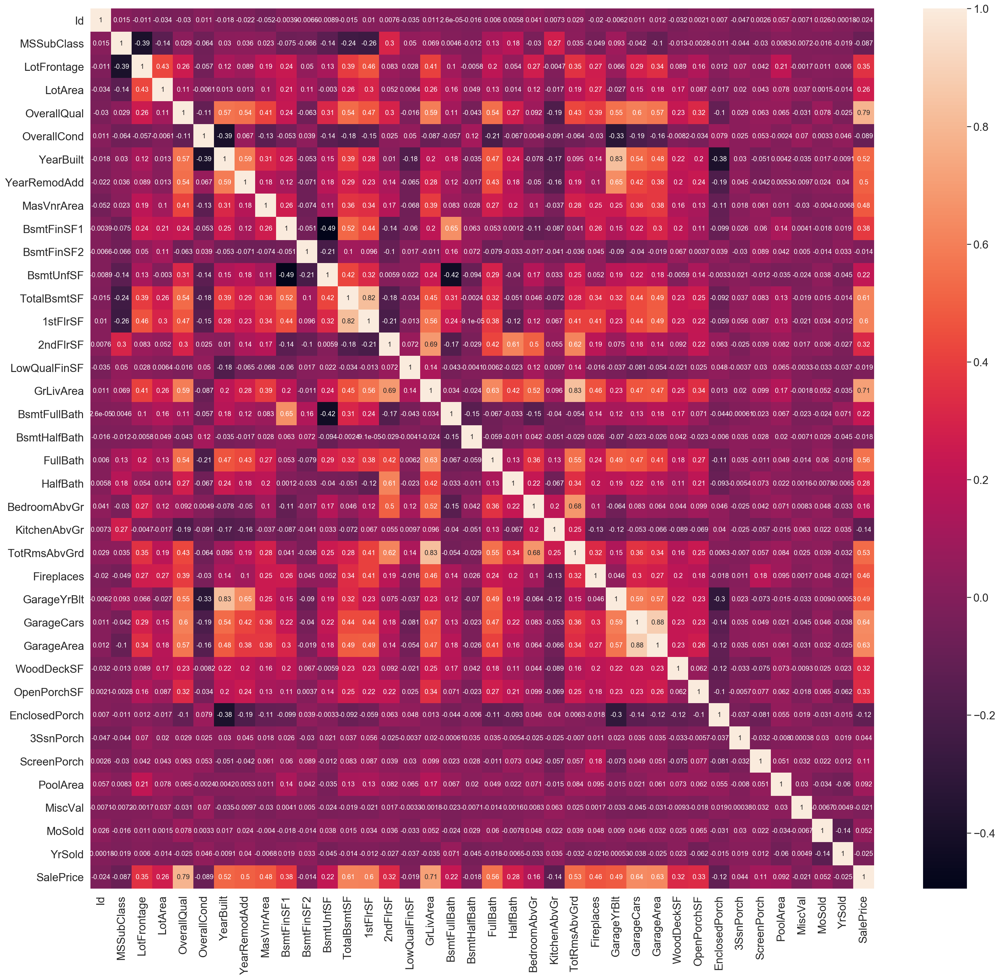

In [1213]:
fig, ax = plt.subplots(figsize=(26, 24))
sns.heatmap(house.corr(),annot=True,  ax=ax)
plt.show()

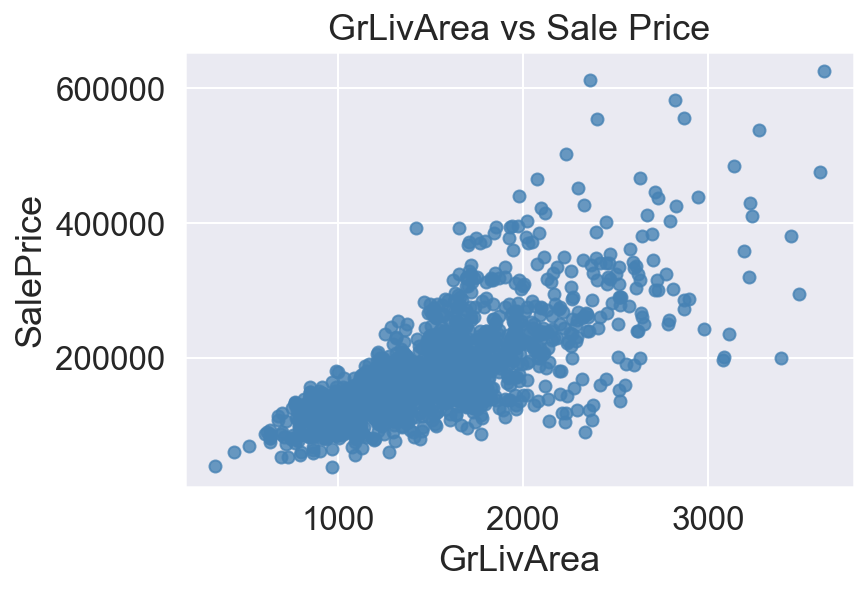

In [1273]:
#Plotting the variables that have the most relevant correlation for the anaysis:
fig, ax = plt.subplots(figsize=(6, 4))

sns.regplot('GrLivArea', 'SalePrice', data=house, 
            fit_reg=False,
            color='steelblue', ax=ax)

ax.set_title('GrLivArea vs Sale Price')
plt.show()

In [1215]:
#Adressing missing values

In [1216]:
house[house.isnull().sum(axis=1)>0]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

In [1217]:
# Use a Boolean Series to filter DataFrame rows.
house_null = house[house.isnull()]
house_notnull = house[house.notnull()]
print(house_null)
print(house_notnull)

      Id  MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0    NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
1    NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
2    NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
3    NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
4    NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
...   ..         ...      ...          ...      ...    ...   ...      ...   
1455 NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
1456 NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
1457 NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
1458 NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   
1459 NaN         NaN      NaN          NaN      NaN    NaN   NaN      NaN   

     LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0

In [1218]:
house.isnull().sum().sort_values(ascending=False)

PoolQC           1443
MiscFeature      1398
Alley            1361
Fence            1172
FireplaceQu       681
LotFrontage       259
GarageCond         79
GarageType         79
GarageYrBlt        79
GarageFinish       79
GarageQual         79
BsmtExposure       38
BsmtFinType2       38
BsmtFinType1       37
BsmtCond           37
BsmtQual           37
MasVnrArea          8
MasVnrType          8
Electrical          1
Utilities           0
YearRemodAdd        0
MSSubClass          0
Foundation          0
ExterCond           0
ExterQual           0
Exterior2nd         0
Exterior1st         0
RoofMatl            0
RoofStyle           0
YearBuilt           0
LotConfig           0
OverallCond         0
OverallQual         0
HouseStyle          0
BldgType            0
Condition2          0
BsmtFinSF1          0
MSZoning            0
LotArea             0
Street              0
Condition1          0
Neighborhood        0
LotShape            0
LandContour         0
LandSlope           0
SalePrice 

In [1219]:
house.MiscFeature.value_counts(dropna=False)

NaN     1398
Shed      47
Othr       2
Gar2       2
TenC       1
Name: MiscFeature, dtype: int64

In [1221]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1450 non-null   int64  
 1   MSSubClass     1450 non-null   int64  
 2   MSZoning       1450 non-null   object 
 3   LotFrontage    1191 non-null   float64
 4   LotArea        1450 non-null   int64  
 5   Street         1450 non-null   object 
 6   Alley          89 non-null     object 
 7   LotShape       1450 non-null   object 
 8   LandContour    1450 non-null   object 
 9   Utilities      1450 non-null   object 
 10  LotConfig      1450 non-null   object 
 11  LandSlope      1450 non-null   object 
 12  Neighborhood   1450 non-null   object 
 13  Condition1     1450 non-null   object 
 14  Condition2     1450 non-null   object 
 15  BldgType       1450 non-null   object 
 16  HouseStyle     1450 non-null   object 
 17  OverallQual    1450 non-null   int64  
 18  OverallC

In [1222]:
house.shape

(1450, 81)

In [1223]:
house.isnull().sum().sort_values(ascending=False)

PoolQC           1443
MiscFeature      1398
Alley            1361
Fence            1172
FireplaceQu       681
LotFrontage       259
GarageCond         79
GarageType         79
GarageYrBlt        79
GarageFinish       79
GarageQual         79
BsmtExposure       38
BsmtFinType2       38
BsmtFinType1       37
BsmtCond           37
BsmtQual           37
MasVnrArea          8
MasVnrType          8
Electrical          1
Utilities           0
YearRemodAdd        0
MSSubClass          0
Foundation          0
ExterCond           0
ExterQual           0
Exterior2nd         0
Exterior1st         0
RoofMatl            0
RoofStyle           0
YearBuilt           0
LotConfig           0
OverallCond         0
OverallQual         0
HouseStyle          0
BldgType            0
Condition2          0
BsmtFinSF1          0
MSZoning            0
LotArea             0
Street              0
Condition1          0
Neighborhood        0
LotShape            0
LandContour         0
LandSlope           0
SalePrice 

In [1224]:
#Filling null values in numerical variables with the their mean 
house['LotFrontage'] = pd.to_numeric(house['LotFrontage'], errors = 'coerce')
house['LotFrontage'].fillna(house.LotFrontage.mean(), inplace = True)
house['MasVnrArea'] = pd.to_numeric(house['MasVnrArea'], errors = 'coerce')
house['MasVnrArea'].fillna(house.MasVnrArea.mean(), inplace = True)
house['GarageYrBlt'] = pd.to_numeric(house['GarageYrBlt'], errors = 'coerce')
house['GarageYrBlt'].fillna(house.GarageYrBlt.mean(), inplace = True)

In [1225]:
#Filling null values in object type variables with the their "none" 
house['PoolQC'].fillna('None', inplace = True)
house['Alley'].fillna('None', inplace = True)
house['Fence'].fillna('None', inplace = True)
house['FireplaceQu'].fillna('None', inplace = True)
house['GarageCond'].fillna('None', inplace = True)
house['GarageFinish'].fillna('None', inplace = True)
house['GarageType'].fillna('None', inplace = True)
house['GarageQual'].fillna('None', inplace = True)
house['BsmtFinType2'].fillna('None', inplace = True)
house['BsmtExposure'].fillna('None', inplace = True)
house['BsmtQual'].fillna('None', inplace = True)
house['BsmtCond'].fillna('None', inplace = True)
house['BsmtFinType1'].fillna('None', inplace = True)
house['MiscFeature'].fillna('None', inplace = True)
house['MasVnrType'].fillna('None', inplace = True)
house['Electrical'].fillna('None', inplace = True)

In [1226]:
house.shape

(1450, 81)

In [1227]:
house.Alley.value_counts()

None    1361
Grvl      50
Pave      39
Name: Alley, dtype: int64

In [1228]:
#null values has been removed 
house.isnull().sum().sort_values(ascending=False)

SalePrice        0
Heating          0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
YearRemodAdd     0
YearBuilt        0
OverallCond      0
LandContour      0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
Utilities        0
OverallQual      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
TotalBsmtSF      0
HeatingQC        0
SaleCondition    0
CentralAir       0
GarageArea       0
GarageQual       0
GarageCond       0
PavedDrive       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea    

In [1229]:
house.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1450 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1450 non-null   int64  
 1   MSSubClass     1450 non-null   int64  
 2   MSZoning       1450 non-null   object 
 3   LotFrontage    1450 non-null   float64
 4   LotArea        1450 non-null   int64  
 5   Street         1450 non-null   object 
 6   Alley          1450 non-null   object 
 7   LotShape       1450 non-null   object 
 8   LandContour    1450 non-null   object 
 9   Utilities      1450 non-null   object 
 10  LotConfig      1450 non-null   object 
 11  LandSlope      1450 non-null   object 
 12  Neighborhood   1450 non-null   object 
 13  Condition1     1450 non-null   object 
 14  Condition2     1450 non-null   object 
 15  BldgType       1450 non-null   object 
 16  HouseStyle     1450 non-null   object 
 17  OverallQual    1450 non-null   int64  
 18  OverallC

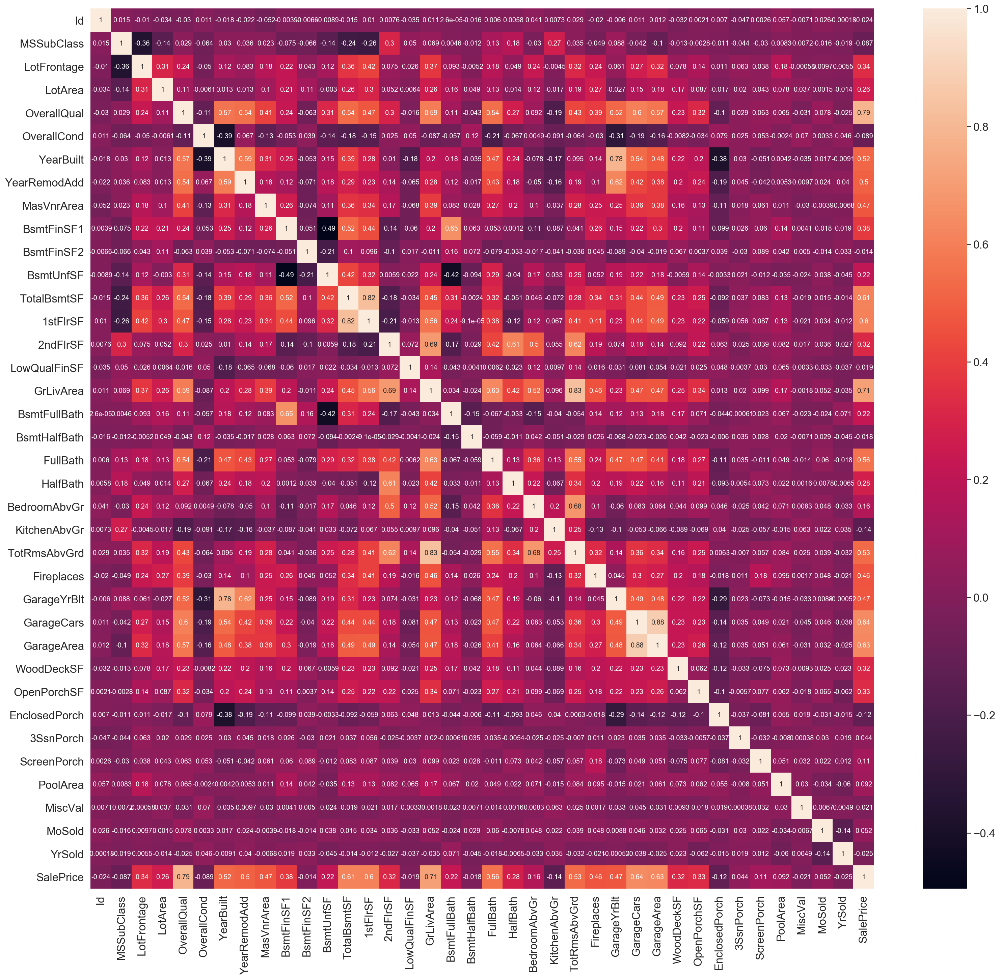

In [1230]:
fig, ax = plt.subplots(figsize=(26, 24))
sns.heatmap(house.corr(),annot=True,  ax=ax)
plt.show()

In [1231]:
#Visuallooking for outliers

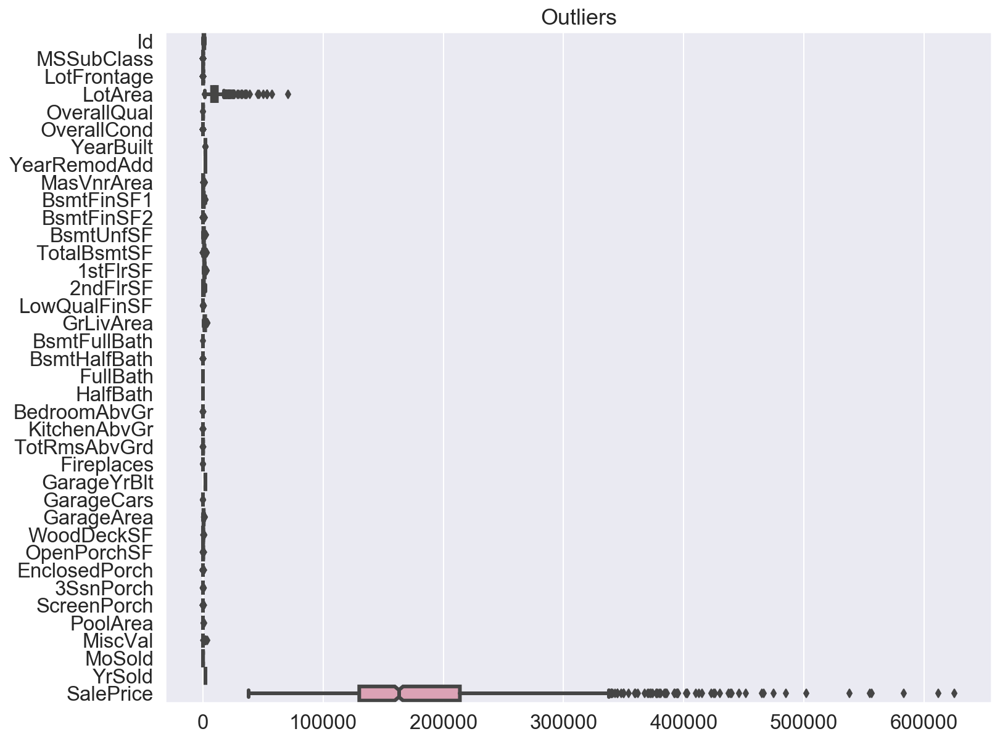

In [1274]:
fig, ax = plt.subplots(figsize=(12, 10))

sns.boxplot(data = house, orient='h', fliersize=5, linewidth=3, notch=True,
           saturation=0.5, ax=ax)

ax.set_title('Outliers')
plt.show()

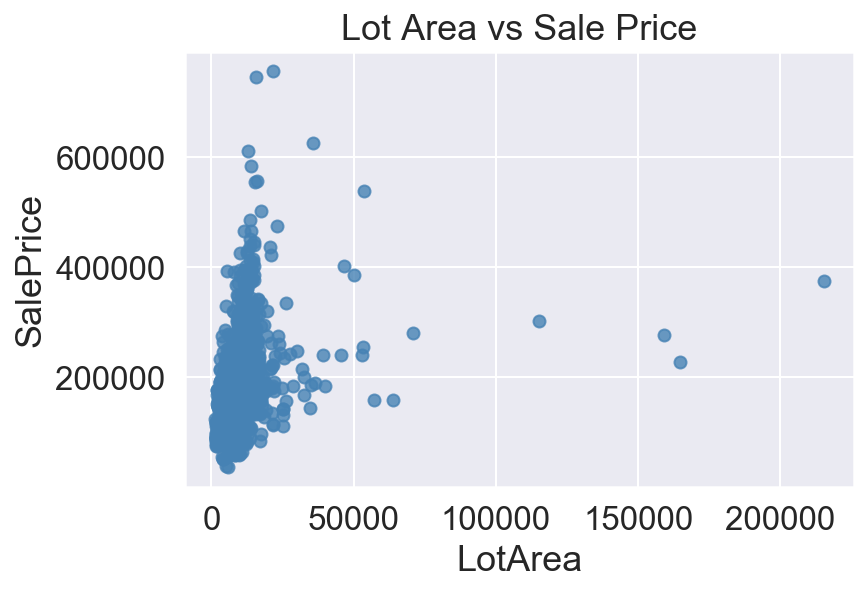

In [1234]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.regplot('LotArea', 'SalePrice', data=house, 
            fit_reg=False,
            color='steelblue', ax=ax)

ax.set_title('Lot Area vs Sale Price')
plt.show()

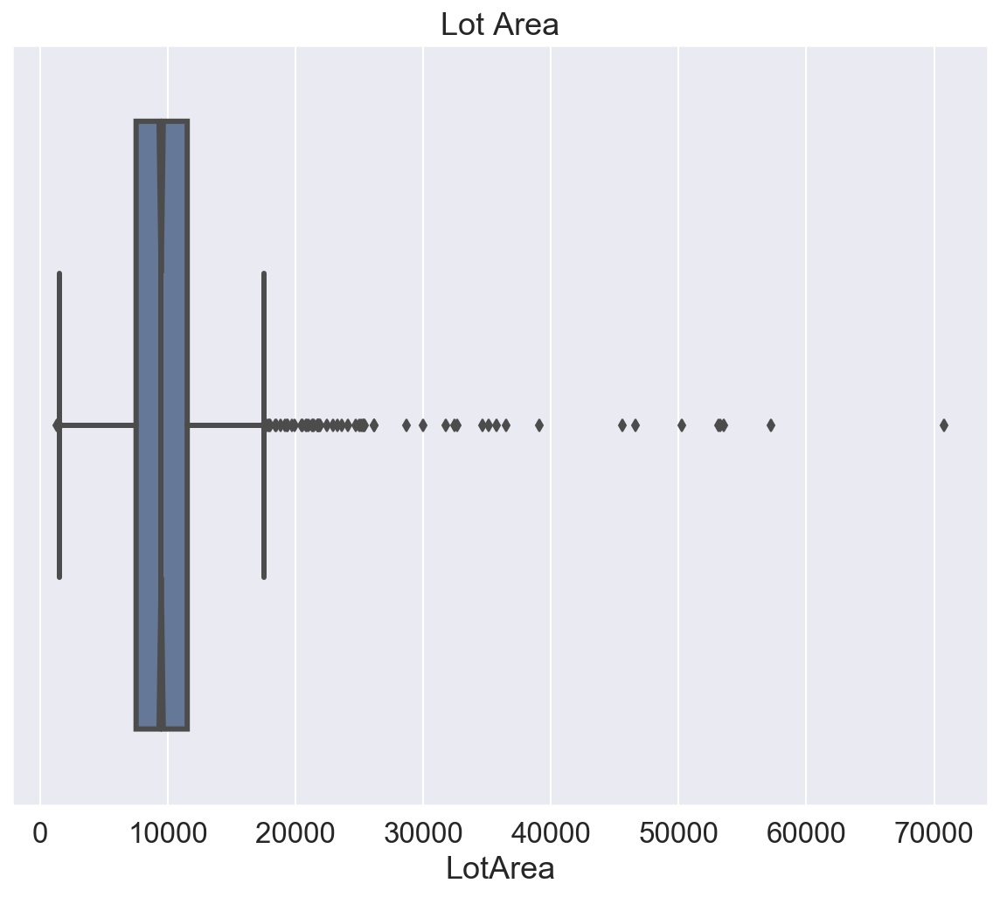

In [1275]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.boxplot(x='LotArea', data= house, orient='h', fliersize=5, linewidth=3, notch=True,
           saturation=0.5, ax=ax)

ax.set_title('Lot Area')
plt.show()

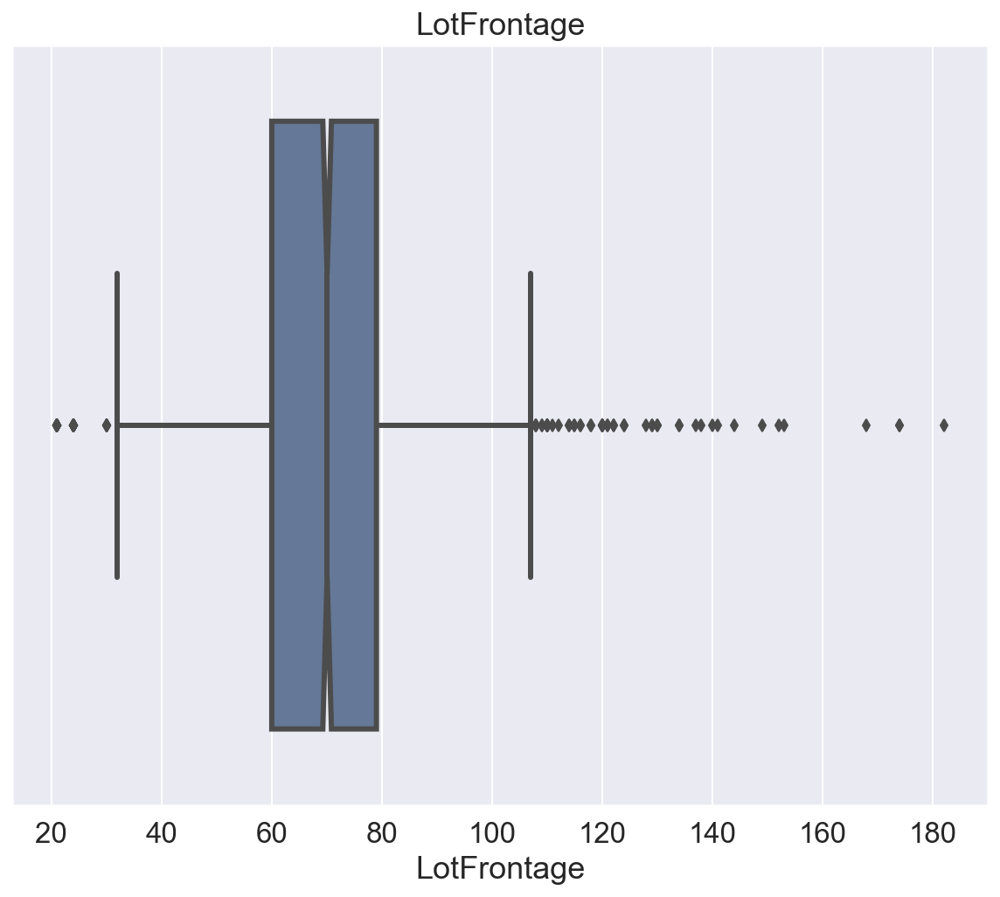

In [1276]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.boxplot(x='LotFrontage', data= house, orient='h', fliersize=5, linewidth=3, notch=True,
           saturation=0.5, ax=ax)

ax.set_title('LotFrontage')
plt.show()

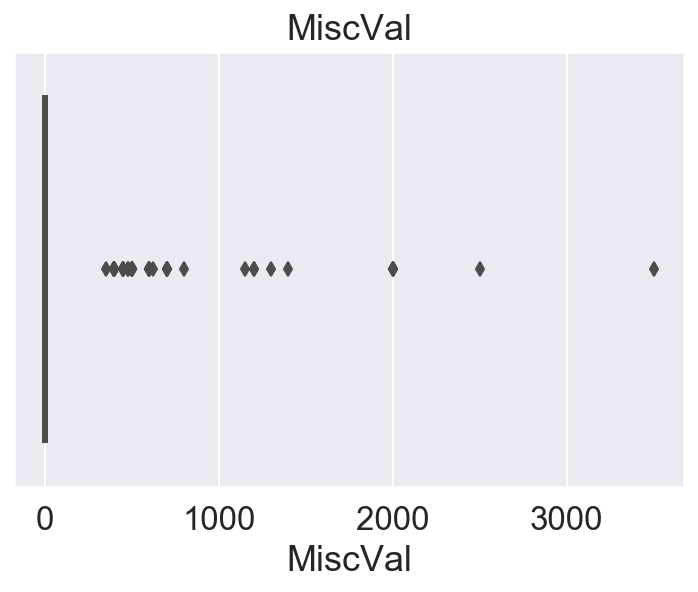

In [1382]:
fig, ax = plt.subplots(figsize=(6, 4))

sns.boxplot(x='MiscVal', data= house, orient='h', fliersize=5, linewidth=3, notch=True,
           saturation=0.5, ax=ax)

ax.set_title('MiscVal')
plt.show()

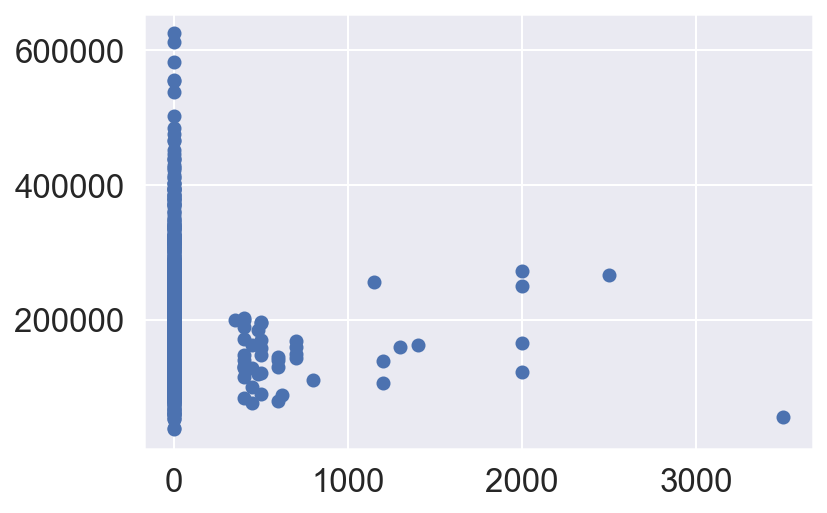

In [1278]:
plt.scatter(x=house['MiscVal'], y=house['SalePrice']);

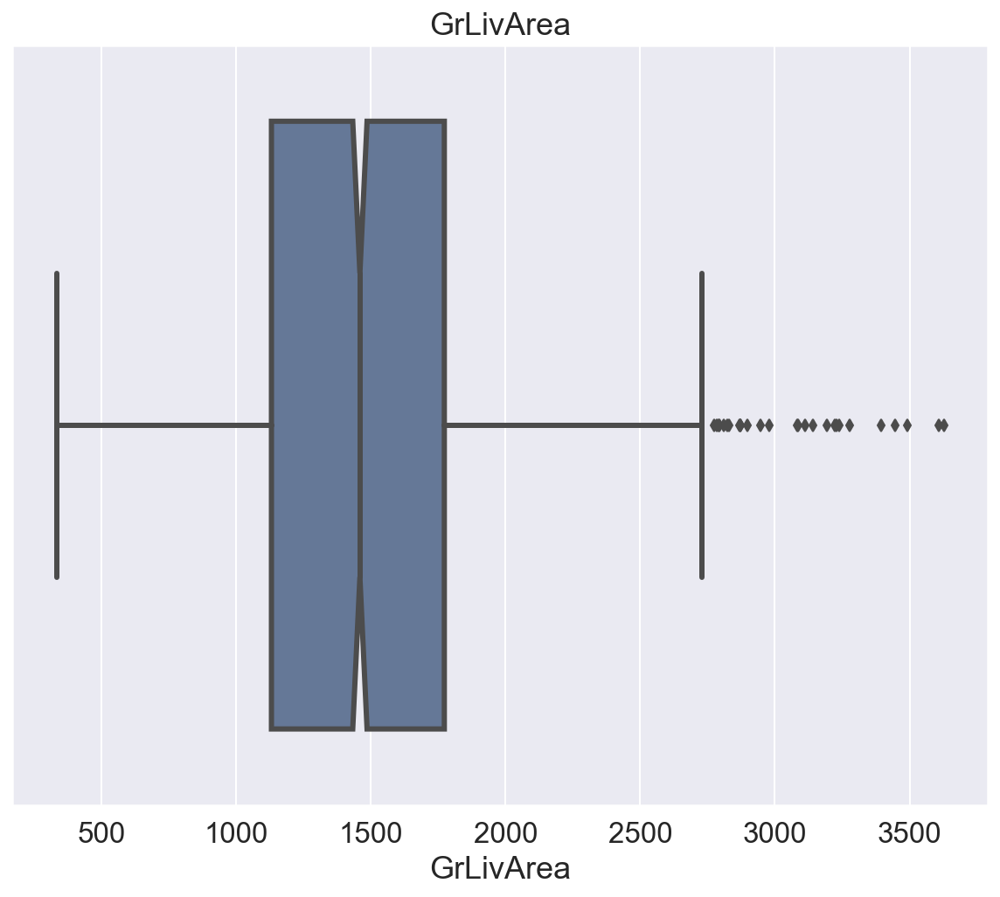

In [1279]:
fig, ax = plt.subplots(figsize=(10, 8))

sns.boxplot(x='GrLivArea', data= house, orient='h', fliersize=5, linewidth=3, notch=True,
           saturation=0.5, ax=ax)

ax.set_title('GrLivArea')
plt.show()

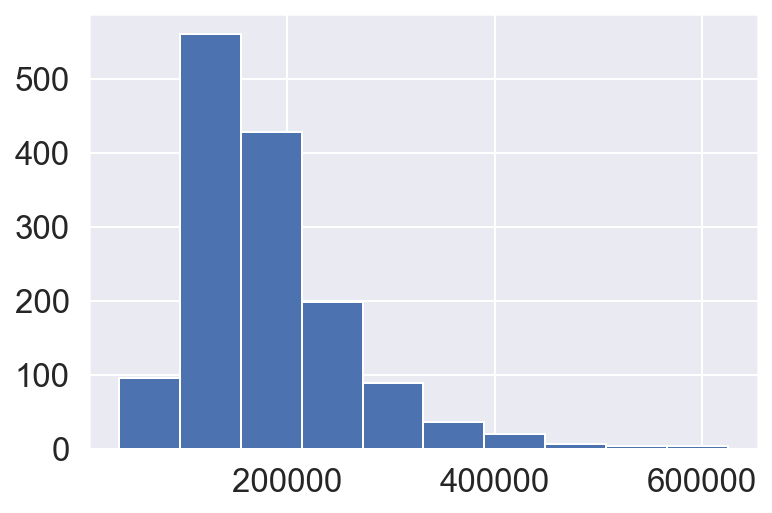

In [1280]:
plt.hist(house.SalePrice)
plt.show()

In [1326]:
house.SalePrice.describe(include='all')

count      1439.000000
mean     180534.027797
std       76281.253551
min       37900.000000
25%      130000.000000
50%      163000.000000
75%      213750.000000
max      625000.000000
Name: SalePrice, dtype: float64

In [1281]:
house.shape

(1439, 81)

In [1282]:
#dropping outliers
house.drop(house[house['LotArea'] >100000].index, axis = 0, inplace = True)
house.drop(house[house['LotFrontage'] >250].index, axis = 0, inplace = True)
house.drop(house[house['GrLivArea'] >4000].index, axis = 0, inplace = True)
house.drop(house[house['MiscVal'] >8000].index, axis = 0, inplace = True)
#house.drop(house[house['MasVnrType'] == 'NA'].index, axis = 0, inplace = True)

### FEATURE ENGENEERING

In [1284]:
#defining fixed and renovable variables and make them into 2 different dataframes
#on exercise 1, only the dataframe for fixed features will be used

In [ ]:
 fixed = ['MSSubClass', 'MSZoning','LotArea', 'LotFrontage', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 
         'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2','BldgType', 'YearBuilt',
         'YearRemodAdd' , 'MasVnrArea', 'Foundation', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2',
         'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 
         'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
         'TotRmsAbvGrd', 'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'PavedDrive',
         'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscFeature',
         'MiscVal', 'MoSold', 'YrSold', 'SaleType', 'SaleCondition', 'SalePrice']

In [1286]:
renov_features= ['HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st','Exterior2nd',
                 'MasVnrType', 'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'BsmtFinType1', 'BsmtFinType2',
                 'HeatingQC', 'LowQualFinSF', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageFinish',
                 'GarageQual', 'GarageCond', 'PoolQC', 'Fence', 'YrSold']

In [1287]:
house_fixed = pd.DataFrame(house[fixed])
house_fixed.head()

,MSSubClass,MSZoning,LotArea,LotFrontage,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,YearBuilt,YearRemodAdd,MasVnrArea,Foundation,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,8450,65.0,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2003,2003,196.0,PConc,No,706,0,150,856,GasA,Y,SBrkr,856,854,1710,1,0,1,3,1,8,0,Attchd,2003.0,2,548,Y,0,61,0,0,0,0,None,0,2,2008,WD,Normal,208500
1,20,RL,9600,80.0,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1976,1976,0.0,CBlock,Gd,978,0,284,1262,GasA,Y,SBrkr,1262,0,1262,0,1,0,3,1,6,1,Attchd,1976.0,2,460,Y,298,0,0,0,0,0,None,0,5,2007,WD,Normal,181500
2,60,RL,11250,68.0,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2001,2002,162.0,PConc,Mn,486,0,434,920,GasA,Y,SBrkr,920,866,1786,1,0,1,3,1,6,1,Attchd,2001.0,2,608,Y,0,42,0,0,0,0,None,0,9,2008,WD,Normal,223500
3,70,RL,9550,60.0,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,1915,1970,0.0,BrkTil,No,216,0,540,756,GasA,Y,SBrkr,961,756,1717,1,0,0,3,1,7,1,Detchd,1998.0,3,642,Y,0,35,272,0,0,0,None,0,2,2006,WD,Abnorml,140000
4,60,RL,14260,84.0,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2000,2000,350.0,PConc,Av,655,0,490,1145,GasA,Y,SBrkr,1145,1053,2198,1,0,1,4,1,9,1,Attchd,2000.0,3,836,Y,192,84,0,0,0,0,None,0,12,2008,WD,Normal,250000


In [1288]:
house_fixed.shape

(1439, 55)

In [1289]:
house_reno = pd.DataFrame(house[renov_features])
house_renov.head()

,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinType2,HeatingQC,LowQualFinSF,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold
0,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,Gd,TA,GLQ,Unf,Ex,0,Gd,Typ,None,RFn,TA,TA,None,None,2008
1,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,Gd,TA,ALQ,Unf,Ex,0,TA,Typ,TA,RFn,TA,TA,None,None,2007
2,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,Gd,TA,GLQ,Unf,Ex,0,Gd,Typ,TA,RFn,TA,TA,None,None,2008
3,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,TA,Gd,ALQ,Unf,Gd,0,Gd,Typ,Gd,Unf,TA,TA,None,None,2006
4,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,Gd,TA,GLQ,Unf,Ex,0,Gd,Typ,TA,RFn,TA,TA,None,None,2008


In [1290]:
house_reno.shape

(1439, 25)

In [1291]:
fixed_dummies = pd.get_dummies(house_fixed, drop_first=True,) 
fixed_dummies

,MSSubClass,LotArea,LotFrontage,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,...,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_None,Electrical_SBrkr,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,PavedDrive_P,PavedDrive_Y,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,8450,65.0,2003,2003,196.0,706,0,150,856,856,854,1710,1,0,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1,20,9600,80.0,1976,1976,0.0,978,0,284,1262,1262,0,1262,0,1,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500,0,1,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
2,60,11250,68.0,2001,2002,162.0,486,0,434,920,920,866,1786,1,0,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
3,70,9550,60.0,1915,1970,0.0,216,0,540,756,961,756,1717,1,0,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
4,60,14260,84.0,2000,2000,350.0,655,0,490,1145,1145,1053,2198,1,0,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000,0,1,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,7917,62.0,1999,2000,0.0,0,0,953,953,953,694,1647,0,0,1,3,1,7,1,1999.0,2,460,0,40,0,0,0,0,0,8,2007,175000,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1456,20,13175,85.0,1978,1988,119.0,790,163,589,1542,2073,0,2073,1,0,0,3,1,7,2,1978.0,2,500,349,0,0,0,0,0,0,2,2010,210000,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1457,70,9042,66.0,1941,2006,0.0,275,0,877,1152,1188,1152,2340,0,0,0,4,1,9,2,1941.0,1,252,0,60,0,0,0,0,2500,5,2010,266500,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1458,20,9717,68.0,1950,1996,0.0,49,1029,0,1078,1078,0,1078,1,0,0,2,1,5,0,1950.0,1,240,366,0,112,0,0,0,0,4,2010,142125,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1

In [1292]:
fixed_dummies.shape

(1439, 138)

In [1293]:
scaler=StandardScaler()

In [1294]:
X_train = fixed_dummies[fixed_dummies['YrSold'] < 2010].copy()
y_train = X_train.pop('SalePrice')


In [1295]:
X_test = fixed_dummies[fixed_dummies['YrSold'] == 2010].copy()
y_test = X_test.pop('SalePrice')

In [1296]:
X_test

,MSSubClass,LotArea,LotFrontage,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,Alley_None,Alley_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_NoSeWa,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,...,Condition2_RRAn,Condition2_RRNn,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_None,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_None,Electrical_SBrkr,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageType_None,PavedDrive_P,PavedDrive_Y,MiscFeature_Othr,MiscFeature_Shed,MiscFeature_TenC,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
16,20,11241,70.052897,1970,1970,180.0,578,0,426,1004,1004,0,1004,1,0,0,2,1,5,1,1970.0,2,480,0,0,0,0,0,0,700,3,2010,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
24,20,8246,70.052897,1968,2001,0.0,188,668,204,1060,1060,0,1060,1,0,0,3,1,6,1,1968.0,1,270,406,90,0,0,0,0,0,5,2010,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
26,20,7200,60.000000,1951,2000,0.0,234,486,180,900,900,0,900,0,1,0,3,1,5,0,2005.0,2,576,222,32,0,0,0,0,0,5,2010,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
27,20,11478,98.000000,2007,2008,200.0,1218,0,486,1704,1704,0,1704,1,0,0,3,1,7,1,2008.0,3,772,0,50,0,0,0,0,0,5,2010,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
33,20,10552,70.000000,1959,1959,0.0,1018,0,380,1398,1700,0,1700,0,1,1,4,1,6,1,1959.0,2,447,0,38,0,0,0,0,0,4,2010,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1438,20,7407,90.000000,1957,1996,0.0,600,0,312,912,1236,0,1236,1,0,0,2,1,6,0,1957.0,2,923,0,158,158,0,0,0,0,4,2010,0,0,1,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1446,20,26142,70.052897,1962,1962,189.0,593,0,595,1188,1188,0,1188,0,0,0,3,1,6,0,1962.0,1,312,261,39,0,0,0,0,0,4,2010,0,1,0,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1456,20,13175,85.000000,1978,1988,119.0,790,163,589,1542,2073,0,2073,1,0,0,3,1,7,2,1978.0,2,500,349,0,0,0,0,0,0,2,2010,0,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
1457,70,9042,66.000000,1941,2006,0.0,275,0,877,1152,1188,1152,2340,0,0,0,4,1,9,2,1941.0,1,252,0,60,0,0,0,0,2500,5,2010,0,1,0,1,1,0,0,0,1,0,0,

In [1297]:
X_test.shape

(172, 137)

In [1298]:
X_train.shape

(1267, 137)

In [1299]:
y_test

16      149000
24      154000
26      134800
27      306000
33      165500
         ...  
1438    149700
1446    157900
1456    210000
1457    266500
1458    142125
Name: SalePrice, Length: 172, dtype: int64

In [1300]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [1301]:
# set max number of columns and rows shown to 10
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)

In [1302]:
kf = KFold(n_splits=10, shuffle=True, random_state=1)

### MODELING

In [1303]:
#linear regression

In [1304]:
# create a linear regression model instance
modelLR = LinearRegression()

# get cross validated scores
scoresLR = cross_val_score(modelLR, X_train, y_train, cv=5)
print("Cross-validated training scores:", scoresLR)
print("Mean cross-validated training score:", scoresLR.mean())
# fit and evaluate the data on the whole training set
modelLR.fit(X_train, y_train)
print("Training Score:", modelLR.score(X_train, y_train))
# evaluate the data on the test set
print("Test Score:", modelLR.score(X_test, y_test))

Cross-validated training scores: [-2.21628637e+04 -1.24725550e+16 -1.42266625e+15 -7.04952031e+21
 -2.98946796e+21]
Mean cross-validated training score: -2.007800434662403e+21
Training Score: 0.9032450224823388
Test Score: 0.8834585655150534


In [1305]:
# Model coefficients in a dataframe
LR_coef = pd.DataFrame(modelLR.coef_, index=X_train.columns,
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
LR_coef['coef_abs'] = LR_coef.coefficients.abs()
LR_coef.sort_values(by= 'coef_abs',ascending=False).iloc[:10]
LR_coef

,coefficients,coef_abs
MSSubClass,-2081.221257,2081.221257
LotArea,6290.900680,6290.900680
LotFrontage,672.121216,672.121216
YearBuilt,9777.473023,9777.473023
YearRemodAdd,6930.370261,6930.370261
...,...,...
SaleCondition_AdjLand,450.250000,450.250000
SaleCondition_Alloca,-136.000000,136.000000
SaleCondition_Family,-160.250000,160.250000
SaleCondition_Normal,2938.000000,2938.000000


In [1306]:
plt.figure(figsize=(120,120))
LR_coef['coefficients'].sort_values().plot(kind='barh');

In [1367]:
#LassoCV Model

In [1368]:
#creating a lassoCV model instance
model_LCV = LassoCV(max_iter=1000000,alphas=np.logspace(-4, 4, 10), cv=5)
model_LCV.fit(X_train, y_train)
print('Best alpha:', model_LCV.alpha_)
lasso = Lasso(alpha=model_LCV.alpha_)
print('Training score:', model_LCV.score(X_train, y_train))
print("Test Score:", model_LCV.score(X_test, y_test))

Best alpha: 1291.5496650148827
Training score: 0.8848347947745976
Test Score: 0.8795732855391751


In [1369]:
scores_lasso = cross_val_score(lasso, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores_lasso)
print("Mean cross-validated training score:", scores_lasso.mean())
lasso.fit(X_train, y_train)
print("Training Score:", lasso.score(X_train, y_train))
print("Test Score:", lasso.score(X_test, y_test))

Cross-validated training scores: [0.87981648 0.89512674 0.86000134 0.84604203 0.83743012]
Mean cross-validated training score: 0.8636833420764921
Training Score: 0.8848347947745976
Test Score: 0.8795732855391751


In [1370]:
# collect the model coefficients in a dataframe
lasso_coef = pd.DataFrame(lasso.coef_, index=X_train.columns,
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
lasso_coef['coef_abs'] = lasso_coef.coefficients.abs()
lasso_coef.sort_values(by='coef_abs',ascending=False).iloc[:10]

,coefficients,coef_abs
GrLivArea,30652.606612,30652.606612
Neighborhood_NridgHt,9710.049012,9710.049012
TotalBsmtSF,9217.611560,9217.611560
BsmtFinSF1,7758.018125,7758.018125
YearRemodAdd,7502.169948,7502.169948
YearBuilt,6861.847874,6861.847874
SaleType_New,6466.612011,6466.612011
Neighborhood_StoneBr,6111.236706,6111.236706
BsmtExposure_Gd,4669.368211,4669.368211
GarageCars,4257.892392,4257.892392


In [1371]:
plt.figure(figsize=(100,90))
lasso_coef['coefficients'].sort_values().plot(kind='barh');

In [1372]:
#ElasticNet model 

In [1373]:
#creating an ElasticNetCV model instance
modelEN = ElasticNetCV(alphas=np.logspace(-4, 4, 10), 
                     l1_ratio=np.array([.1, .5, .7, .9, .95, .99, 1]), cv=5, max_iter=1000000)

modelEN.fit(X_train, y_train)
print('Best alpha:', modelEN.alpha_)
elasticnet = ElasticNet(alpha=modelEN.alpha_, l1_ratio=modelEN.l1_ratio_)
print('Best l1-ratio:', modelEN.l1_ratio_)
print('Training score:', modelEN.score(X_train, y_train))
print("Test Score:", modelEN.score(X_test, y_test))

Best alpha: 1291.5496650148827
Best l1-ratio: 1.0
Training score: 0.8848347947745976
Test Score: 0.8795732855391751


In [1374]:
#Cross-validated scores for ElasticNet 
scores_ElasticNet = cross_val_score(modelEN, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores_ElasticNet)
print("Mean cross-validated training score:", scores_ElasticNet.mean())
modelEN.fit(X_train, y_train)
print("Training Score:", modelEN.score(X_train, y_train))
print("Test Score:", modelEN.score(X_test, y_test))

Cross-validated training scores: [0.87353776 0.89281615 0.86000134 0.83863097 0.8338968 ]
Mean cross-validated training score: 0.8597766046612358
Training Score: 0.8848347947745976
Test Score: 0.8795732855391751


In [1375]:
#Coefficients in a dataframe
EN_coef = pd.DataFrame(modelEN.coef_, index=X_train.columns,
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
EN_coef['coef_abs'] = EN_coef.coefficients.abs()
EN_coef.sort_values(by='coef_abs',ascending=False).iloc[:10]

,coefficients,coef_abs
GrLivArea,30652.606612,30652.606612
Neighborhood_NridgHt,9710.049012,9710.049012
TotalBsmtSF,9217.611560,9217.611560
BsmtFinSF1,7758.018125,7758.018125
YearRemodAdd,7502.169948,7502.169948
YearBuilt,6861.847874,6861.847874
SaleType_New,6466.612011,6466.612011
Neighborhood_StoneBr,6111.236706,6111.236706
BsmtExposure_Gd,4669.368211,4669.368211
GarageCars,4257.892392,4257.892392


In [1376]:
#ElasticNet coeficients
plt.figure(figsize=(100,90))
EN_coef['coefficients'].sort_values().plot(kind='barh');

In [1307]:
#RidgeCV model

In [1308]:
np.logspace(-4, 4, 10)

array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04])

In [1309]:
10**np.linspace(-4, 4, 10)

array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04])

In [1313]:
# creating Ridge CV model instance
model_RCV = RidgeCV(alphas=np.logspace(-4, 4, 10), cv=5)
model_RCV.fit(X_train, y_train)
print('Best alpha:', model_RCV.alpha_)
Ridge_RCV = Ridge(alpha=model_RCV.alpha_)
print('Training score:', model_RCV.score(X_train, y_train))
print("Test Score:", model_RCV.score(X_test, y_test))

Best alpha: 166.81005372000558
Training score: 0.89871325866994
Test Score: 0.8846291180907829


In [1317]:
# Cross-validation
scores_RCV= cross_val_score(model_RCV, X_train, y_train, cv=5)
print("Cross-validated training scores:", scores_RCV)
print("Mean cross-validated training score:", scores_RCV.mean())
model_RCV.fit(X_train, y_train)
print("Training Score:", model_RCV.score(X_train, y_train))
print("Test Score:", model_RCV.score(X_test, y_test))

Cross-validated training scores: [0.87873104 0.89191612 0.86649605 0.83804628 0.83457154]
Mean cross-validated training score: 0.8619522080676324
Training Score: 0.89871325866994
Test Score: 0.8846291180907829


In [1365]:
#coefficients in a dataframe
RCV_coef = pd.DataFrame(model_RCV.coef_, index=X_train.columns,
                       columns=['coefficients'])
# calculate the absolute values of the coefficients
RCV_coef['coef_abs'] = RCV_coef.coefficients.abs()
RCV_coef.sort_values(by='coef_abs',ascending=False).iloc[:10]

,coefficients,coef_abs
GrLivArea,12715.994740,12715.994740
TotalBsmtSF,9029.096545,9029.096545
2ndFlrSF,8689.739314,8689.739314
Neighborhood_NridgHt,8334.631062,8334.631062
BsmtFinSF1,7744.026689,7744.026689
1stFlrSF,7316.809393,7316.809393
YearRemodAdd,6612.234852,6612.234852
TotRmsAbvGrd,6168.415691,6168.415691
Neighborhood_StoneBr,6119.612323,6119.612323
YearBuilt,5212.565932,5212.565932


In [1366]:
plt.figure(figsize=(120,120))
Ridge_coef['coefficients'].sort_values().plot(kind='barh');

In [1377]:
#Residuals for question2

In [1378]:
train_residuals = y_train - model_RCV.predict(X_train)
test_residuals = y_test - model_RCV.predict(X_test)
print('Residual train:', train_residuals)
print('Residual test:', test_residuals)

Residual train: 0        2717.179918
1      -11770.570472
2       13230.461497
3      -43371.465758
4      -42429.678287
            ...     
1452     1417.725711
1453   -54408.991244
1454    -9178.935292
1455     -434.074197
1459    -8639.831554
Name: SalePrice, Length: 1267, dtype: float64
Residual test: 16      -2676.560573
24       7079.646006
26       9810.432707
27      12707.621748
33      -8125.809849
            ...     
1438   -12405.241853
1446     8743.652677
1456   -20113.709215
1457    30084.073181
1458     6799.339977
Name: SalePrice, Length: 172, dtype: float64


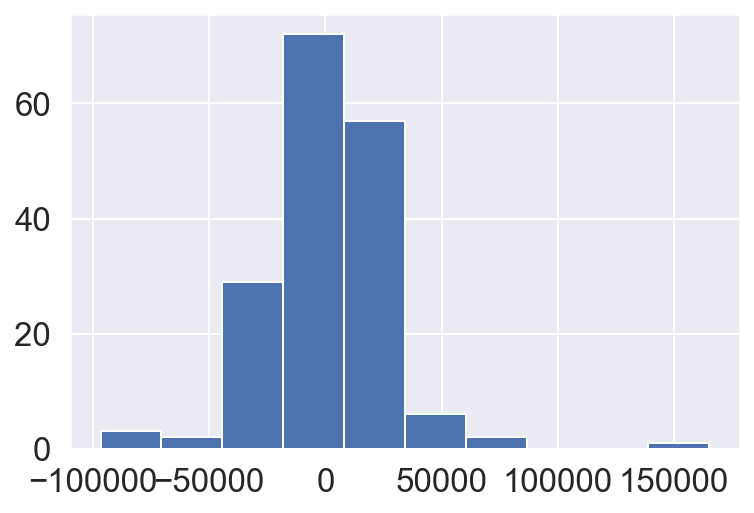

In [1379]:
plt.hist(test_residuals)
plt.show()

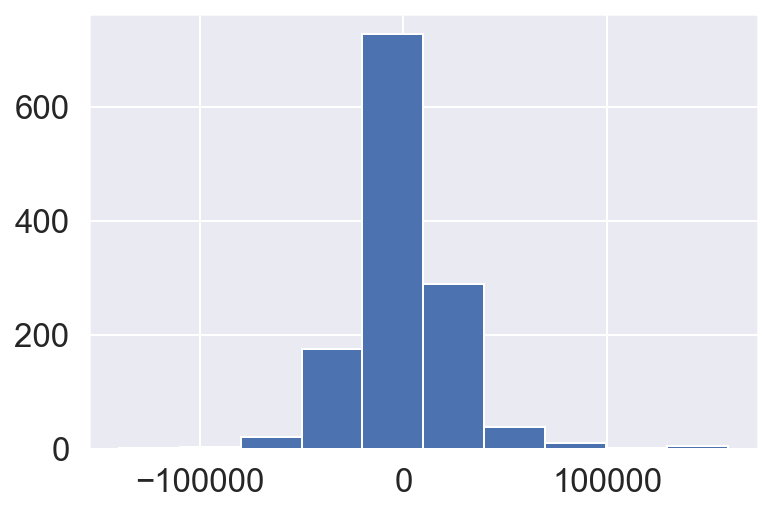

In [1380]:
plt.hist(train_residuals)
plt.show()

Conclusion: 
Based on the scores results from the models tested, RidgeCV has been selected, since it brings the best cross-validated test score: 0.8846, which is quitte good score. According it, 'GrLivArea', 'TotalBsmtSF, 2ndFlrSF and and specific neighborhood (NridgHt) and the best estimatives for the price


<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovatable features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

In [1383]:
#Renovateable features dataframedefined on question 1
house_reno.head()

,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtFinType1,BsmtFinType2,HeatingQC,LowQualFinSF,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,YrSold
0,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,Gd,TA,GLQ,Unf,Ex,0,Gd,Typ,None,RFn,TA,TA,None,None,2008
1,1Story,6,8,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,Gd,TA,ALQ,Unf,Ex,0,TA,Typ,TA,RFn,TA,TA,None,None,2007
2,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,Gd,TA,GLQ,Unf,Ex,0,Gd,Typ,TA,RFn,TA,TA,None,None,2008
3,2Story,7,5,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,TA,Gd,ALQ,Unf,Gd,0,Gd,Typ,Gd,Unf,TA,TA,None,None,2006
4,2Story,8,5,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,Gd,TA,GLQ,Unf,Ex,0,Gd,Typ,TA,RFn,TA,TA,None,None,2008


In [1384]:
house_reno.shape

(1439, 25)

In [1385]:
house_fixed.shape

(1439, 55)

In [1387]:
dummies_reno = pd.get_dummies(house_reno, drop_first=True) 
dummies_reno

,OverallQual,OverallCond,LowQualFinSF,YrSold,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,...,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,PoolQC_Fa,PoolQC_Gd,PoolQC_None,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None
0,7,5,0,2008,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
1,6,8,0,2007,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
2,7,5,0,2008,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
3,7,5,0,2006,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
4,8,5,0,2008,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,6,5,0,2007,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
1456,6,6,0,2010,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0
1457,7,9,0,2010,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0
1458,5,6,0,2010,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1


In [1388]:
dummies_without_year = dummies_reno.drop(columns=['YrSold'])
dummies_without_year.head()

,OverallQual,OverallCond,LowQualFinSF,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,...,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_None,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_None,BsmtFinType2_Rec,BsmtFinType2_Unf,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_None,FireplaceQu_Po,FireplaceQu_TA,GarageFinish_None,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Fa,GarageQual_Gd,GarageQual_None,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_None,GarageCond_Po,GarageCond_TA,PoolQC_Fa,PoolQC_Gd,PoolQC_None,Fence_GdWo,Fence_MnPrv,Fence_MnWw,Fence_None
0,7,5,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
1,6,8,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
2,7,5,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
3,7,5,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1
4,8,5,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1


In [1389]:
dummies_reno.shape

(1439, 119)

In [1390]:
fixed_dummies.shape

(1439, 138)

In [1391]:
dummies_without_year.shape

(1439, 118)

In [1392]:
train_residuals = y_train - model_RCV.predict(X_train)
test_residuals = y_test - model_RCV.predict(X_test)
print('Residual train:', train_residuals)
print('Residual test:', test_residuals)

Residual train: 0        2717.179918
1      -11770.570472
2       13230.461497
3      -43371.465758
4      -42429.678287
            ...     
1452     1417.725711
1453   -54408.991244
1454    -9178.935292
1455     -434.074197
1459    -8639.831554
Name: SalePrice, Length: 1267, dtype: float64
Residual test: 16      -2676.560573
24       7079.646006
26       9810.432707
27      12707.621748
33      -8125.809849
            ...     
1438   -12405.241853
1446     8743.652677
1456   -20113.709215
1457    30084.073181
1458     6799.339977
Name: SalePrice, Length: 172, dtype: float64


In [1393]:
train_residuals.shape

(1267,)

In [1394]:
test_residuals.shape

(172,)

In [1395]:
X_train_reno = dummies_reno[dummies_reno.YrSold < 2010]
[dummies_without_year] 
#in this code, the year is used only for slicing the data, but is not part of the reno features
X_test_reno = dummies_reno[dummies_reno.YrSold == 2010]
[dummies_without_year]

#residuals from exercise 1
y_train_reno = train_residuals
y_test_reno = test_residuals

In [1396]:
scaler=StandardScaler()

In [1397]:
scaler = StandardScaler()
X_train_reno = pd.DataFrame(scaler.fit_transform(X_train_reno), columns=X_train_reno.columns) 
X_test_reno = pd.DataFrame(scaler.transform(X_test_reno), columns=X_test_reno.columns)

In [1398]:
Kf = KFold(n_splits=10, shuffle=True, random_state=1)

In [1399]:
#Linear Regression

In [1400]:
# Creating a linear regression model instance
modelLR_reno = LinearRegression()

# get cross validated scores
scoresLR_reno = cross_val_score(modelLR_reno, X_train_reno, y_train_reno, cv=5)
print("Cross-validated training scores:", scoresLR_reno)
print("Mean cross-validated training score:", scoresLR_reno.mean())
# fit and evaluate the data on the whole training set
modelLR_reno.fit(X_train_reno, y_train_reno)
print("Training Score:", modelLR_reno.score(X_train_reno, y_train_reno))
# evaluate the data on the test set
print("Test Score:", modelLR_reno.score(X_test_reno, y_test_reno))

Cross-validated training scores: [-5.07399018e+19 -3.99227072e+21 -1.94944476e+22 -3.38370045e+21
 -1.60761039e+24]
Mean cross-validated training score: -3.26906308809242e+23
Training Score: 0.3154824170533064
Test Score: -4.623990638930723e+20


In [1401]:
#Lasso

In [1402]:
# Creating a Lasso model instance
modelLCV_reno = LassoCV(alphas=np.logspace(-2, 2, 20), cv=5,  max_iter=10000) 
modelLCV_reno.fit(X_train_reno, y_train_reno)
print("Best alpha:", modelLCV_reno.alpha_)
alpha = modelLCV_reno.alpha_
modelLCV_reno = Lasso(alpha=alpha)

scoresLCV_reno = cross_val_score(modelLCV_reno, X_train_reno, y_train_reno, cv=5)
print("Cross-validated training scores:", scoresLCV_reno)
print("Mean cross-validated training score:", scoresLCV_reno.mean())
modelLCV_reno.fit(X_train_reno, y_train_reno)
print("Training Score:", modelLCV_reno.score(X_train_reno, y_train_reno))
print("Test Score:", modelLCV_reno.score(X_test_reno, y_test_reno))

Best alpha: 100.0
Cross-validated training scores: [0.07984284 0.10418738 0.14865683 0.13900418 0.14254842]
Mean cross-validated training score: 0.12284792952864262
Training Score: 0.29845897368985874
Test Score: 0.2573198916658346


In [1403]:
#Ridge

In [1404]:
# Creating a Ridge model instance
model = RidgeCV(alphas=np.logspace(-2, 2, 20), cv=5) 
model.fit(X_train_reno, y_train_reno)
print("Best alpha:", model.alpha_)
alpha = model.alpha_
model = Ridge(alpha=alpha)

scores = cross_val_score(model, X_train_reno, y_train_reno, cv=5)
print("Cross-validated training scores:", scores)
print("Mean cross-validated training score:", scores.mean())
model.fit(X_train_reno, y_train_reno)
print("Training Score:", model.score(X_train_reno, y_train_reno))
print("Test Score:", model.score(X_test_reno, y_test_reno))

Best alpha: 100.0
Cross-validated training scores: [0.07447286 0.11761898 0.14424014 0.1529117  0.1511048 ]
Mean cross-validated training score: 0.12806969650923214
Training Score: 0.29736611413750613
Test Score: 0.2431686521592219


In [1405]:
#ElasticNet

In [1410]:
# Creating a ElasticNet model instance
modelELN_reno = ElasticNetCV(alphas=np.logspace(-2, 2, 20), cv=5,  max_iter=1000000) 
modelELN_reno.fit(X_train_reno, y_train_reno)
print("Best alpha:", modelELN_reno.alpha_)
alpha = modelELN_reno.alpha_
modelELN_reno = ElasticNet(alpha=alpha)

scoresELN_reno = cross_val_score(modelELN_reno, X_train_reno, y_train_reno, cv=5)
print("Cross-validated training scores:", scoresELN_reno)
print("Mean cross-validated training score:", scoresELN_reno.mean())
modelELN_reno.fit(X_train_reno, y_train_reno)
print("Training Score:", modelELN_reno.score(X_train_reno, y_train_reno))
print("Test Score:", modelELN_reno.score(X_test_reno, y_test_reno))

Best alpha: 0.4832930238571752
Cross-validated training scores: [0.07820924 0.14706932 0.14743357 0.15682003 0.15393126]
Mean cross-validated training score: 0.1366926834128408
Training Score: 0.27438596817640837
Test Score: 0.2196384721624013


In [1429]:
# collect the model coefficients in a dataframe
lasso_reno_coef = pd.DataFrame(modelLCV_reno.coef_, index=X_train_reno.columns,
                       columns=['coefficients'])
lasso_reno_coef['coef_abs_reno'] = lasso_reno_coef.coefficients.abs()
lasso_reno_coef.sort_values(by='coef_abs_reno',ascending=False).iloc[:10]

,coefficients,coef_abs_reno
OverallQual,7027.804154,7027.804154
KitchenQual_Gd,-6026.420623,6026.420623
OverallCond,4961.507501,4961.507501
BsmtQual_Gd,-4438.490915,4438.490915
KitchenQual_TA,-4380.371063,4380.371063
ExterQual_TA,-3713.335570,3713.335570
ExterQual_Gd,-3270.101557,3270.101557
Functional_Typ,3244.901780,3244.901780
Exterior1st_BrkFace,3091.477173,3091.477173
PoolQC_Gd,2578.245682,2578.245682


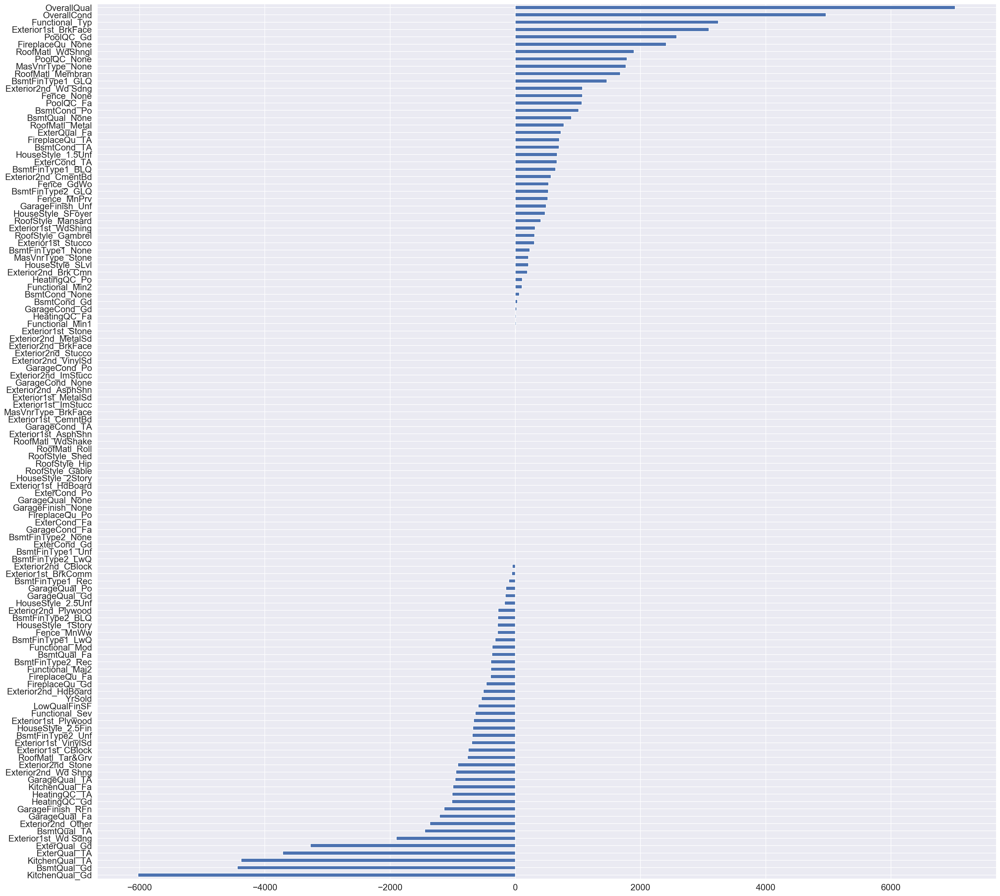

In [1430]:
lasso_reno_coef['coefficients'].sort_values().plot(kind='barh', figsize=(30, 30));

    #Conclusion: The model that works better is Lasso, with a score of 0.2573, which is a considerably low. 
    After fitting the models and exploring the visuals,it is possble to conclude that this part of the model probably should not be used for the decision of buying or not a property, as per my recomendation. 
    If this model has to be used considering its 2 parts, I would reccomend renovations in the kitchen, as pointed by the vairables 'KitchenQual_Gd' and 'KitchenQual_TA'(2ND and 4thh most impactant in the price). Together they impact almost as much as the the'OverallQual and BsmtQual_Gd' togeter, (respectively 1st and the 2nd in the list of most impactants).
    Secondarly, considering both of the parts of this model, I would recomend renovations on the basement in general, since this featureis present on both of the 2 list of top 5 of impactable variables on the price.
    Ultimately, I would recomend the neiboorhoods NridgHt and StoneBr. NridgHt for being number 4th highest predictor, as I mensioned in question 1 and StoneBr for not being too far behind in the sores. 

<img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. It is recommended to do some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [ ]:
# A: